In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pandas_profiling

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split

from sklearn import metrics
from sklearn.model_selection import KFold
from  sklearn.model_selection import cross_val_score
import warnings
import sklearn.metrics
import pandas_profiling as pf
warnings.filterwarnings('ignore')
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import plotly.express as pe
from sklearn import preprocessing
from scipy.integrate import quad
%matplotlib inline

<ipython-input-3-85925058da85>:12: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pf


##Data uploads

In [4]:
data_train=pd.read_csv('/content/drive/MyDrive/My_Projects/train.csv')
data_test=pd.read_csv('/content/drive/MyDrive/My_Projects/test.csv')
df=pd.DataFrame(data_train)
df2=pd.DataFrame(data_test)
df3=df2.drop(columns=['id']) # test data 

##Data Preparations

In [5]:
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [6]:
df3

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
2,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
3,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
4,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,17,644,913,2121,14,8,15,1,1,0
996,609,0,1.8,1,0,0,13,0.9,186,4,2,1152,1632,1933,8,1,19,0,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,12,477,825,1223,5,0,14,1,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,12,38,832,2509,15,11,6,0,1,0


In [7]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [8]:
df3.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [10]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  1000 non-null   int64  
 1   blue           1000 non-null   int64  
 2   clock_speed    1000 non-null   float64
 3   dual_sim       1000 non-null   int64  
 4   fc             1000 non-null   int64  
 5   four_g         1000 non-null   int64  
 6   int_memory     1000 non-null   int64  
 7   m_dep          1000 non-null   float64
 8   mobile_wt      1000 non-null   int64  
 9   n_cores        1000 non-null   int64  
 10  pc             1000 non-null   int64  
 11  px_height      1000 non-null   int64  
 12  px_width       1000 non-null   int64  
 13  ram            1000 non-null   int64  
 14  sc_h           1000 non-null   int64  
 15  sc_w           1000 non-null   int64  
 16  talk_time      1000 non-null   int64  
 17  three_g        1000 non-null   int64  
 18  touch_scr

In [11]:
pf.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [13]:
df3.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000
mean,1248.510000,0.516000,1.540900,0.517000,4.593000,0.487000,33.652000,0.517500,139.51100,4.328000,10.054000,627.121000,1239.774000,2138.998000,11.995000,5.316000,11.085000,0.756000,0.50000,0.507000
std,432.458227,0.499994,0.829268,0.499961,4.463325,0.500081,18.128694,0.280861,34.85155,2.288155,6.095099,432.929699,439.670981,1088.092278,4.320607,4.240062,5.497636,0.429708,0.50025,0.500201
min,500.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.00000,1.000000,0.000000,0.000000,501.000000,263.000000,5.000000,0.000000,2.000000,0.000000,0.00000,0.000000
25%,895.000000,0.000000,0.700000,0.000000,1.000000,0.000000,18.000000,0.300000,109.75000,2.000000,5.000000,263.750000,831.750000,1237.250000,8.000000,2.000000,6.750000,1.000000,0.00000,0.000000
50%,1246.500000,1.000000,1.500000,1.000000,3.000000,0.000000,34.500000,0.500000,139.00000,4.000000,10.000000,564.500000,1250.000000,2153.500000,12.000000,5.000000,11.000000,1.000000,0.50000,1.000000
75%,1629.250000,1.000000,2.300000,1.000000,7.000000,1.000000,49.000000,0.800000,170.00000,6.000000,16.000000,903.000000,1637.750000,3065.500000,16.000000,8.000000,16.000000,1.000000,1.00000,1.000000
max,1999.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.00000,8.000000,20.000000,1907.000000,1998.000000,3989.000000,19.000000,18.000000,20.000000,1.000000,1.00000,1.000000


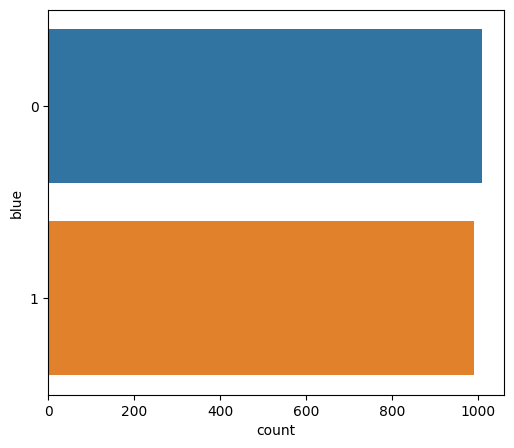

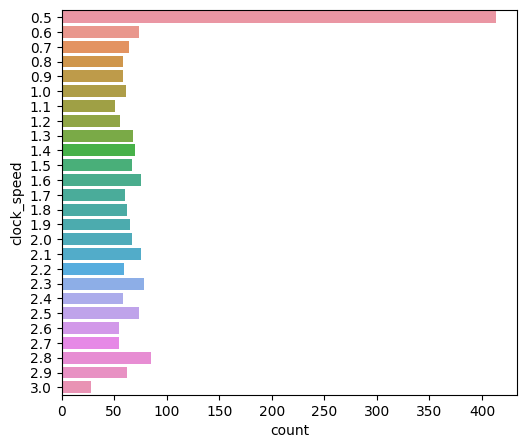

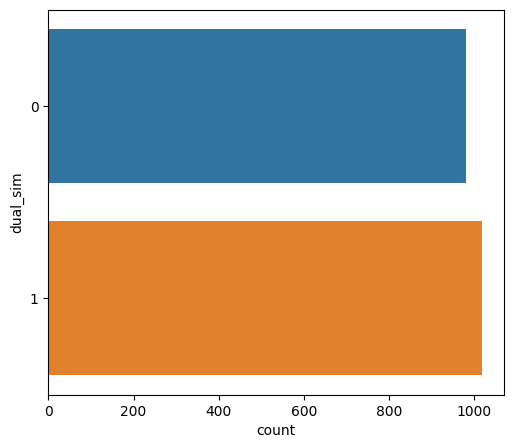

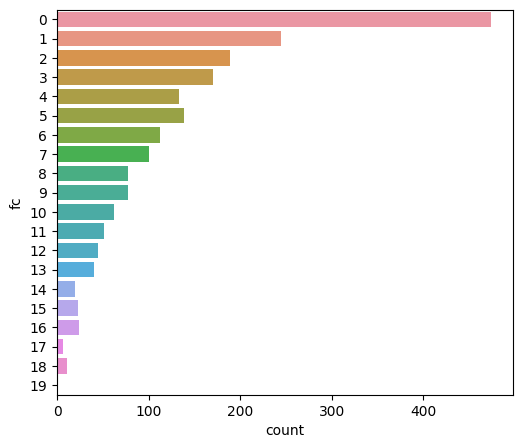

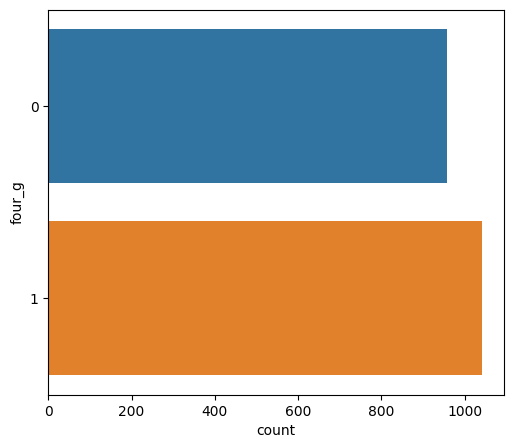

...

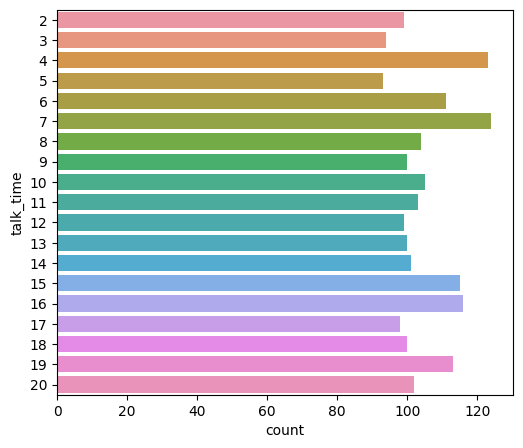

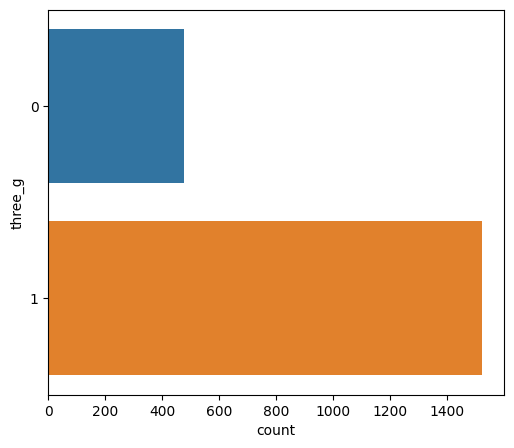

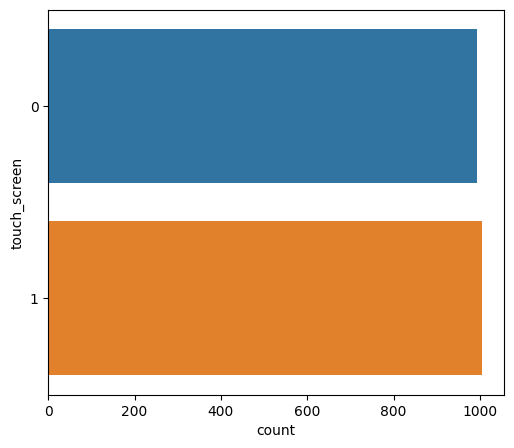

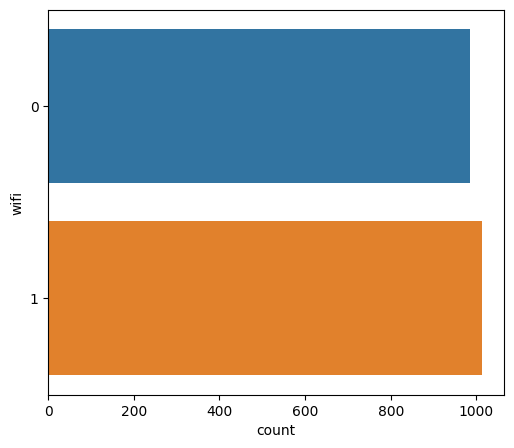

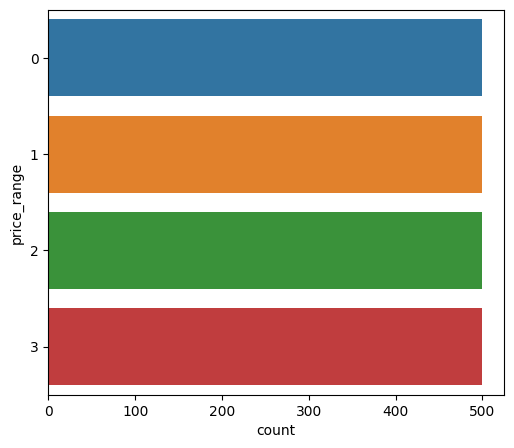

In [14]:
df_discrete=['blue','clock_speed','dual_sim','fc','four_g','m_dep','n_cores','pc','sc_h','sc_w','talk_time','three_g','touch_screen','wifi','price_range']
i=0
while i <16:
    fig=plt.figure(figsize=[20,5])
    
   
    plt.subplot(1,3,1)
    sns.countplot(y=df_discrete[i],data=df)
    
    i+=1
    if i ==15:
        break

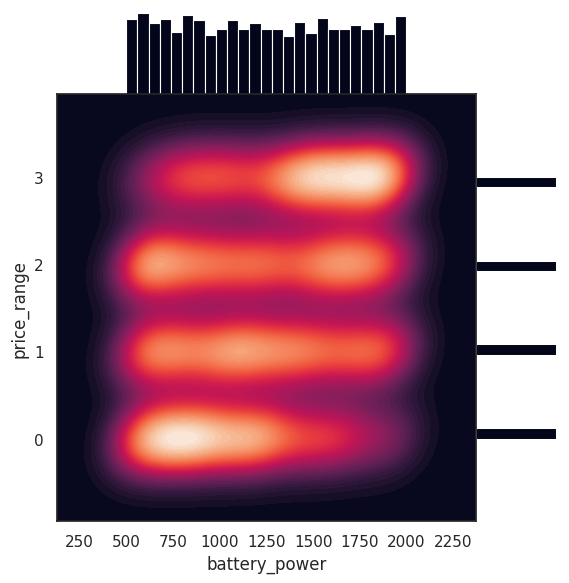

In [15]:
sns.set_theme(style="white")

g = sns.JointGrid(data=df, x='battery_power',y='price_range',space=0)

g.plot_joint(sns.kdeplot,fill=True,thresh=0, levels=100, cmap="rocket")
g.plot_marginals(sns.histplot, color="#03051A", alpha=1, bins=25)

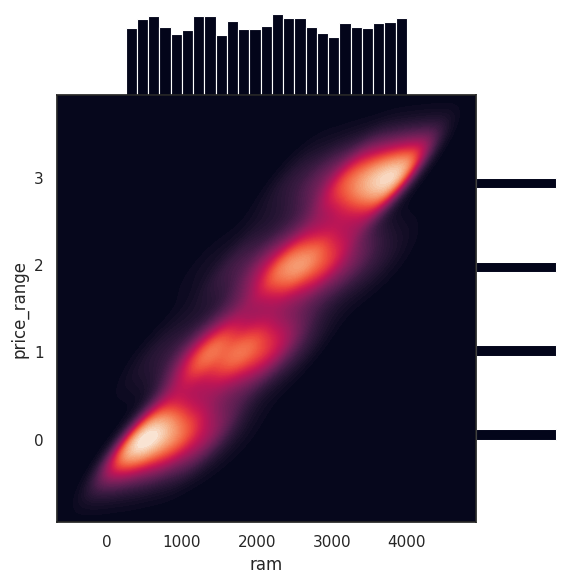

In [16]:
sns.set_theme(style="white")

g = sns.JointGrid(data=df, x='ram',y='price_range',space=0)

g.plot_joint(sns.kdeplot,fill=True,thresh=0, levels=100, cmap="rocket")
g.plot_marginals(sns.histplot, color="#03051A", alpha=1, bins=25)

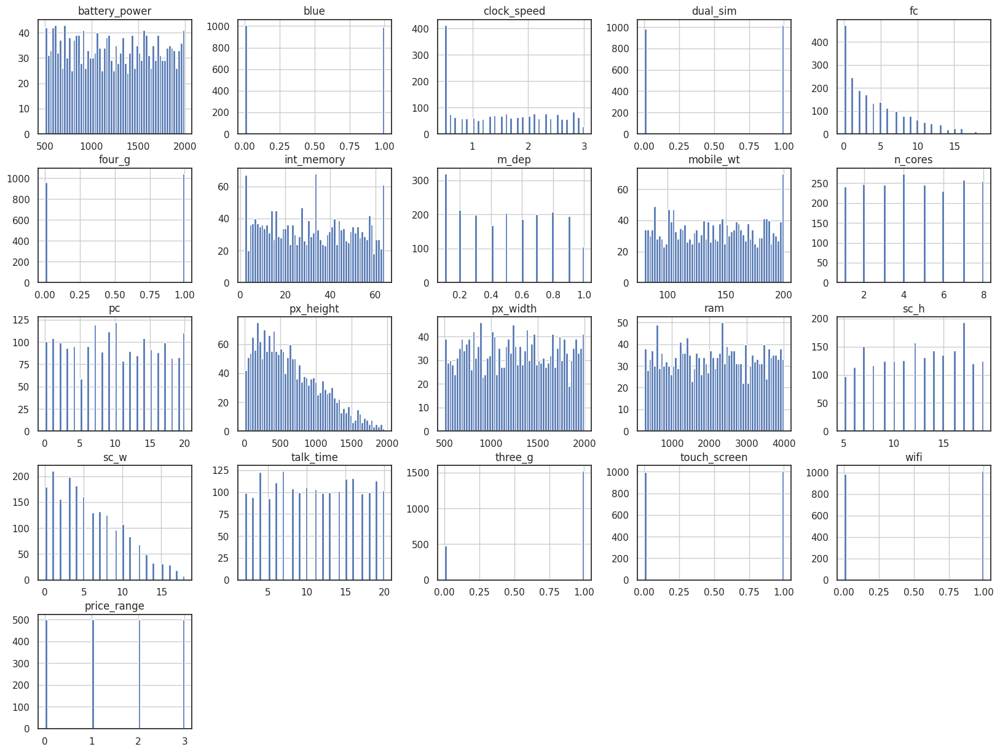

In [17]:
df.hist(bins=60,figsize=(20,15))
plt.show()

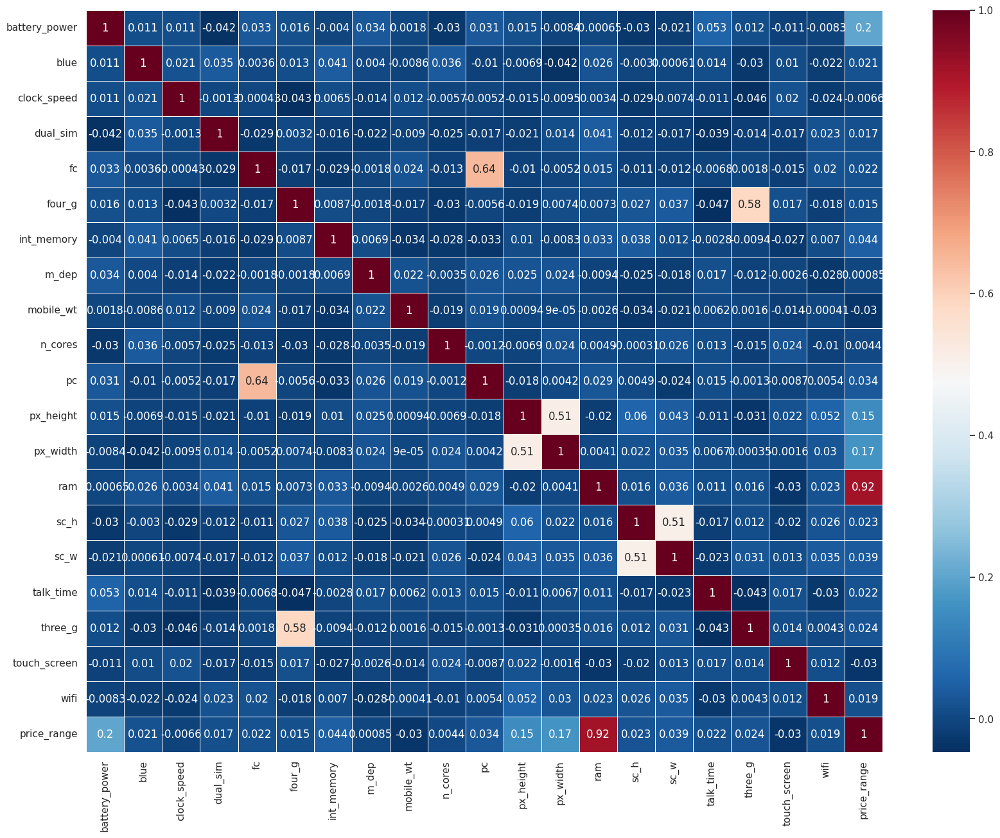

In [18]:
b,c=plt.subplots(figsize=(20,15))
sns.heatmap(df.corr(),cmap='RdBu_r',cbar=True,annot=True,linewidths=0.5,ax=c)
plt.show()

<Axes: xlabel='ram', ylabel='price_range'>

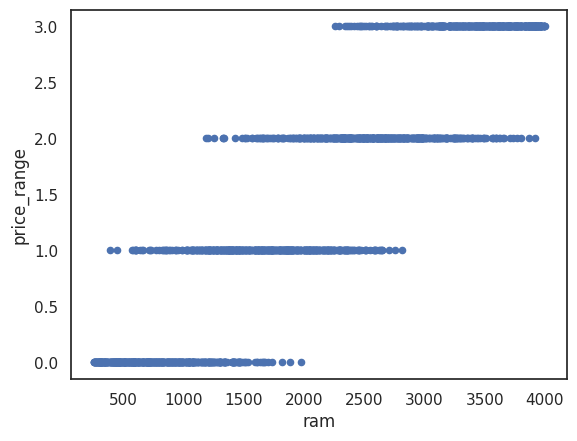

In [19]:
df.plot(kind='scatter',x='ram',y='price_range',alpha=1)

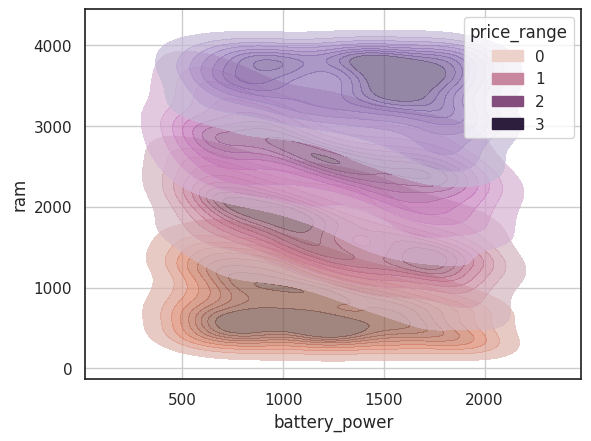

In [20]:
sns.kdeplot(data=df,x='battery_power', y='ram', hue='price_range',color='b',alpha=.7,weights=None,fill=True,multiple='fill', palette=None)
plt.grid()

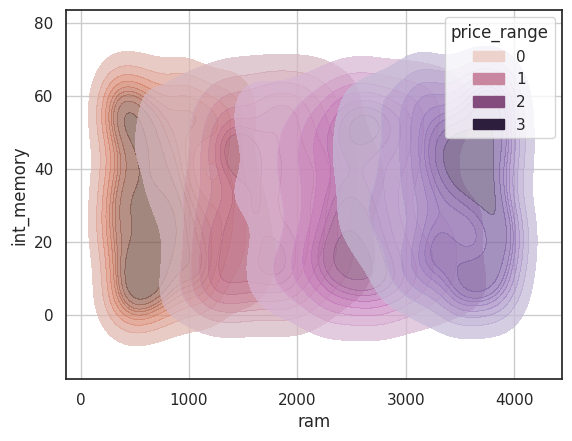

In [21]:
sns.kdeplot(data=df,x='ram', y='int_memory', hue='price_range',color='b',alpha=.7,weights=None,fill=True,multiple='fill', palette=None)
plt.grid()

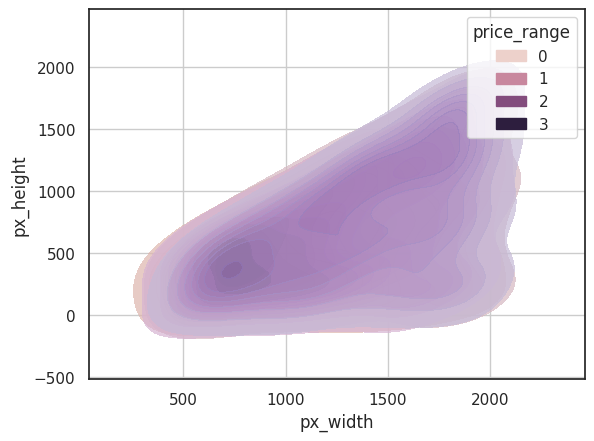

In [22]:
sns.kdeplot(data=df,x='px_width', y='px_height', hue='price_range',color='b',alpha=.7,weights=None,fill=True,multiple='fill', palette=None)
plt.grid()

In [23]:
fig = pe.box(df, x='talk_time', color='price_range')
fig2=pe.box(df,x='ram',color='price_range')
fig3=pe.box(df,x='battery_power',color='price_range')
fig4=pe.box(df,x='clock_speed',color='price_range')
fig5=pe.box(df,x='int_memory',color='price_range')
fig6=pe.box(df,x='mobile_wt',color='price_range')
fig7=pe.box(df,x='n_cores',color='price_range')
fig8=pe.box(df,x='px_width',color='price_range')
fig9=pe.box(df,x='px_height',color='price_range')

fig.show()
fig2.show()
fig3.show()
fig4.show()
fig5.show()
fig6.show()
fig7.show()
fig8.show()
fig9.show()

In [24]:
scaler=preprocessing.MinMaxScaler(feature_range=(0,1))
norm=scaler.fit_transform(df.drop(['price_range'],axis=1))
norm_test=scaler.fit_transform(df3)
norm_df=pd.DataFrame(norm,columns=['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'])
norm_test_df=pd.DataFrame(norm_test,columns=['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'])

##DecisionTree :

In [25]:
x=pd.DataFrame(norm_df)
y=pd.DataFrame(df['price_range'].values.reshape(-1,1))

In [26]:
max_depth=range(1,300)
Criterion= ['entropy','gini','log_loss']
Splitter=['best', 'random']
Random_state=[0,1]
def dts(x,y,testsize,Criterion,Splitter,maxdeth,randomstate):
    df_dts=pd.DataFrame()
    for i in testsize:
        for a in Criterion:
            for b in Splitter :
                for c in maxdeth:
                    for d in randomstate:
                        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=i,random_state=d)
                        clf=DecisionTreeClassifier( class_weight='balanced',max_depth=c,criterion=a, splitter=b)
                        clf.fit(x_train,y_train)
                        y_pred=clf.predict(x_test)
                        dict={'test_size':i,'acc':metrics.accuracy_score(y_test,y_pred),'score':clf.score(x,y),'Criterion':a,'Splitter':b,'max_depth':c,'random_state':d}
                        df_dts=df_dts.append(dict,ignore_index=True)
                   
            
    return(df_dts.sort_values(by='acc') )
    return(clf)
   
    

dc=dts(x,y,[.1,.15,.2,.17,.25,.3,.4,.05,.13,.22,.07,.23],Criterion,Splitter,max_depth,Random_state)


dc.tail(10).style.highlight_max(color = 'yellow', axis = 0, subset=[ 'acc'])

,test_size,acc,score,Criterion,Splitter,max_depth,random_state
27410,0.050000,0.920000,0.996000,gini,random,251,0
25738,0.050000,0.920000,0.989500,entropy,random,13,0
26182,0.050000,0.920000,0.996000,entropy,random,235,0
27188,0.050000,0.920000,0.996000,gini,random,140,0
28144,0.050000,0.920000,0.996000,log_loss,random,20,0
28410,0.050000,0.920000,0.996000,log_loss,random,153,0
28468,0.050000,0.930000,0.996500,log_loss,random,182,0
25846,0.050000,0.930000,0.996500,entropy,random,67,0
28570,0.050000,0.930000,0.996500,log_loss,random,233,0
39094,0.070000,0.942857,0.996000,log_loss,random,113,0


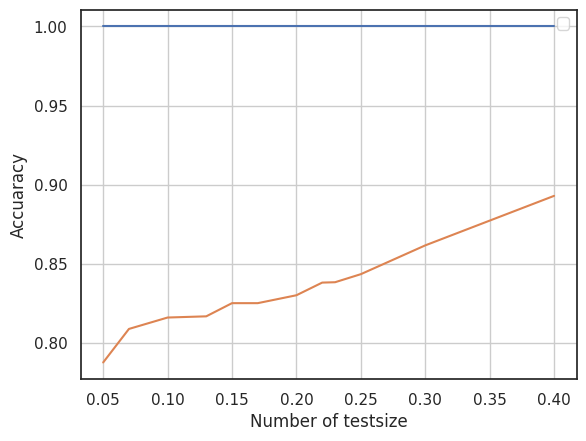

In [27]:
training_acc= []
test_acc=[]
testsize=[.1,.15,.2,.17,.25,.3,.4,.05,.13,.22,.07,.23]

for l in testsize:
   
        
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=l,random_state=0)
    clf=DecisionTreeClassifier(class_weight='balanced',max_depth=83,criterion='gini', splitter='random')
    clf.fit(x_train,y_train)
    training_acc.append(clf.score(x_train,y_train))
    test_acc.append(clf.score(x_test,y_test))
    test_acc.sort()
    training_acc
    testsize.sort()
plt.plot(testsize,training_acc)
plt.plot(testsize,test_acc)

plt.xlabel('Number of testsize')
plt.ylabel('Accuaracy')
plt.grid()
plt.legend()

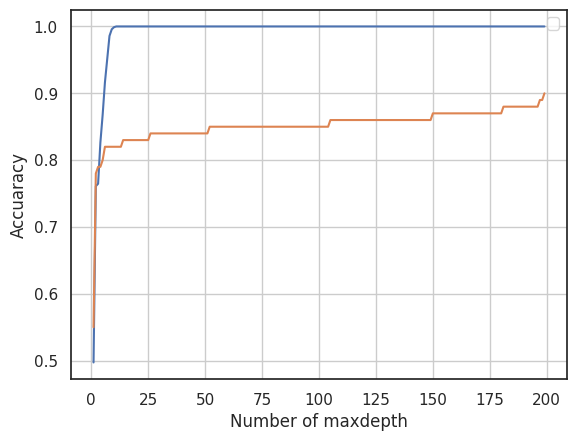

In [28]:
training_acc= []
test_acc=[]
maxdepth=range(1,200)

for i in maxdepth:
    
        
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.05,random_state=0)
    clf=DecisionTreeClassifier(class_weight='balanced',max_depth=i,criterion='entropy', splitter='best')
    clf.fit(x_train,y_train)
    training_acc.append(clf.score(x_train,y_train))
    test_acc.append(clf.score(x_test,y_test))
    test_acc.sort()
    training_acc
    testsize.sort()
plt.plot(maxdepth,training_acc)
plt.plot(maxdepth,test_acc)

plt.xlabel('Number of maxdepth')
plt.ylabel('Accuaracy')
plt.grid()
plt.legend()

In [29]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.05,random_state=0)
clf=DecisionTreeClassifier(class_weight='balanced',max_depth=67,criterion='gini', splitter='random')
clf.fit(x_train,y_train) 
y_pred=clf.predict(x_test)
print('accuaracy:',metrics.accuracy_score(y_test,y_pred))

accuaracy: 0.86


In [30]:
print((metrics.classification_report(y_test,y_pred)))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91        21
           1       0.83      0.71      0.77        21
           2       0.77      0.83      0.80        24
           3       0.94      0.91      0.93        34

    accuracy                           0.86       100
   macro avg       0.85      0.85      0.85       100
weighted avg       0.86      0.86      0.86       100



Text(0.5, 1.0, 'Actual')

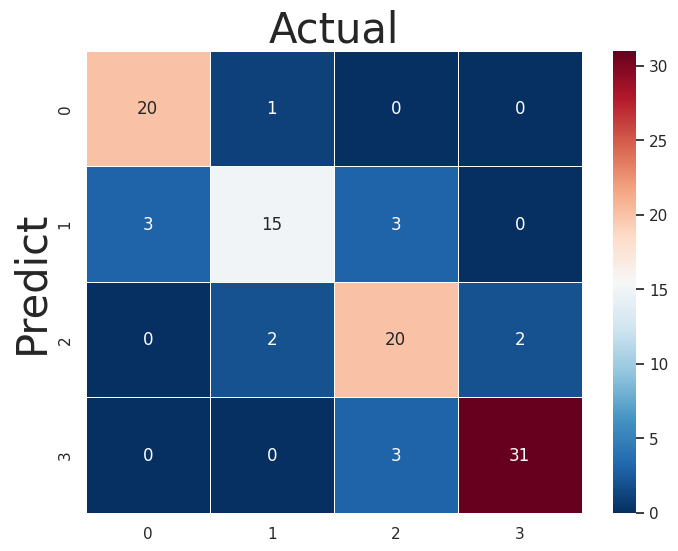

In [31]:
confusion_matrix=(metrics.confusion_matrix(y_test,y_pred))
fig, ax = plt.subplots(figsize = (8,6)) 
ax = sns.heatmap(confusion_matrix,cmap='RdBu_r',cbar=True,annot=True,linewidths=0.5,ax=ax)
plt.ylabel('Predict',fontsize=30)
plt.title('Actual',fontsize=30)

##RandomForest models

In [32]:
from sklearn.ensemble import RandomForestClassifier

In [33]:
N_estimators=range(1,100)
df_dts=pd.DataFrame()
for i in N_estimators:   
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.05,random_state=0)
    clf=RandomForestClassifier(n_estimators=i ,class_weight='balanced',max_depth=96,criterion='entropy')
    clf.fit(x_train,y_train)
    y_pred=clf.predict(x_test)
    dict={'test_size':i,'acc':metrics.accuracy_score(y_test,y_pred),'score':clf.score(x,y),'n_estimators':i}
    df_dts=df_dts.append(dict,ignore_index=True)
                   
            
df_dts2=df_dts.sort_values(by='acc') 
df_dts2.tail(10).style.highlight_max(color = 'yellow', axis = 0, subset=[ 'acc'])

,test_size,acc,score,n_estimators
66,67.000000,0.880000,0.994000,67.000000
31,32.000000,0.880000,0.993500,32.000000
30,31.000000,0.880000,0.994000,31.000000
65,66.000000,0.890000,0.994500,66.000000
45,46.000000,0.890000,0.994500,46.000000
53,54.000000,0.890000,0.994500,54.000000
84,85.000000,0.890000,0.994500,85.000000
90,91.000000,0.890000,0.994500,91.000000
91,92.000000,0.900000,0.995000,92.000000
85,86.000000,0.910000,0.995500,86.000000


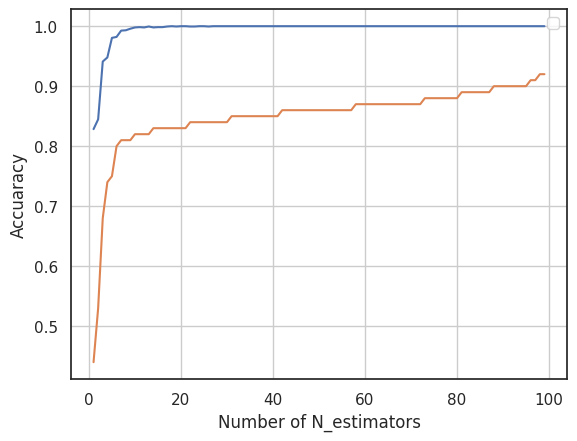

In [34]:
training_acc= []
test_acc=[]
N_estimators=range(1,100)

for n in N_estimators:
    
        
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.05,random_state=0)
    clf=RandomForestClassifier(n_estimators=n,class_weight='balanced',max_depth=69)
    clf.fit(x_train,y_train)
    training_acc.append(clf.score(x_train,y_train))
    test_acc.append(clf.score(x_test,y_test))
    test_acc.sort()
    training_acc
    testsize.sort()
plt.plot(N_estimators,training_acc)
plt.plot(N_estimators,test_acc)

plt.xlabel('Number of N_estimators')
plt.ylabel('Accuaracy')
plt.grid()
plt.legend()

##SVM models

In [35]:
from sklearn.svm import SVC

In [36]:
svm=SVC(kernel='linear',C=4)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.0622,random_state=0)
svm.fit(x_train,y_train)
y_pred=svm.predict(x_test)
print('accuaracy:',metrics.accuracy_score(y_test,y_pred))

accuaracy: 0.976


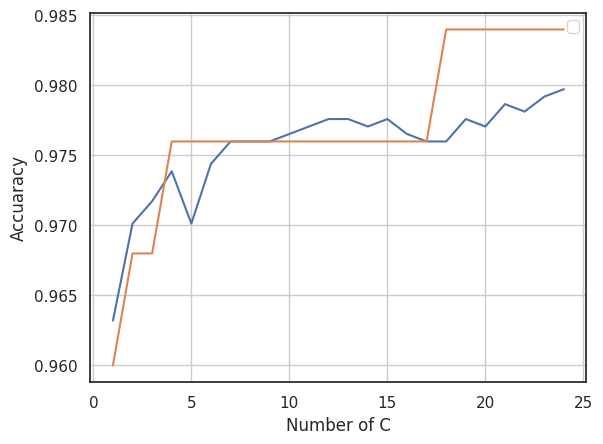

In [37]:
training_acc= []
test_acc=[]

C=range(1,25)

for i in C:
    
        
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.0622,random_state=0)
    clf=SVC(kernel='linear',C=i,class_weight='balanced')
    clf.fit(x_train,y_train)
    training_acc.append(clf.score(x_train,y_train))
    test_acc.append(clf.score(x_test,y_test))
    test_acc.sort()
    training_acc
    
plt.plot(C,training_acc)
plt.plot(C,test_acc)

plt.xlabel('Number of C')
plt.ylabel('Accuaracy')
plt.grid()
plt.legend()

##Now we modeling again

In [38]:
svm=SVC(kernel='linear',C=1.4)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.050,random_state=0)
svm2=svm.fit(x_train,y_train)
y_pred=svm.predict(x_test)
print('accuaracy:',metrics.accuracy_score(y_test,y_pred))

accuaracy: 0.98


In [39]:
print(metrics.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        21
           1       1.00      0.95      0.98        21
           2       0.96      0.96      0.96        24
           3       0.97      1.00      0.99        34

    accuracy                           0.98       100
   macro avg       0.98      0.98      0.98       100
weighted avg       0.98      0.98      0.98       100



Text(0.5, 1.0, 'Actual')

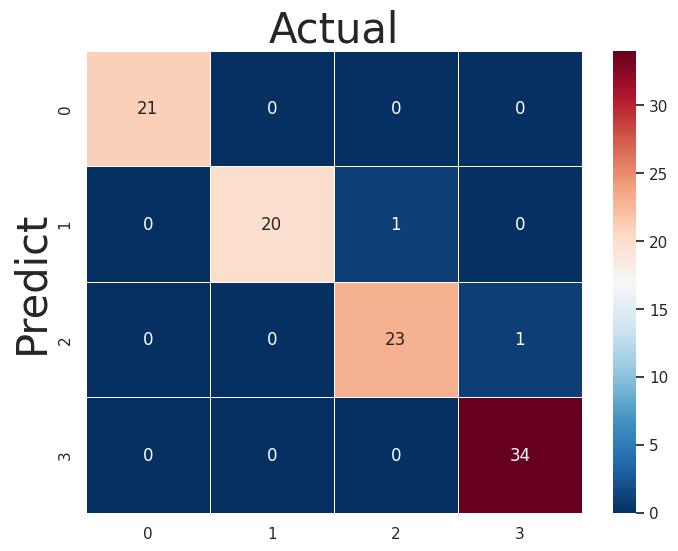

In [40]:
confusion_matrix=(metrics.confusion_matrix(y_test,y_pred))
fig, ax = plt.subplots(figsize = (8,6)) 
ax = sns.heatmap(confusion_matrix,cmap='RdBu_r',cbar=True,annot=True,linewidths=0.5,ax=ax)
plt.ylabel('Predict',fontsize=30)
plt.title('Actual',fontsize=30)

##Predicting test values

In [41]:
df3

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
2,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
3,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
4,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,17,644,913,2121,14,8,15,1,1,0
996,609,0,1.8,1,0,0,13,0.9,186,4,2,1152,1632,1933,8,1,19,0,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,12,477,825,1223,5,0,14,1,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,12,38,832,2509,15,11,6,0,1,0


In [42]:
predict_=svm2.predict(norm_test_df)

predict_

array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 1, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 3, 0, 3, 0, 3, 1, 1, 3, 3, 3, 0, 1, 1, 1,
       2, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 1, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 1, 2, 1, 2, 2, 0, 2, 1, 2, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 2, 1, 2, 0, 3, 2, 2, 2, 0, 2,
       2, 1, 3, 1, 1, 0, 3, 2, 1, 2, 1, 3, 2, 3, 3, 3, 2, 3, 2, 3, 1, 0,
       3, 2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       0, 0, 1, 2, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       2, 3, 1, 2, 3, 2, 3, 2, 2, 1, 0, 0, 1, 3, 0, 2, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 3, 1, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 0, 2, 3, 1, 1, 3, 2, 1, 3, 0, 0, 3, 0, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 1, 2, 1, 2, 0, 2, 3, 1,

In [43]:
df3['price_range']=predict_
df3

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1043,1,1.8,1,14,0,5,0.1,193,3,...,226,1412,3476,12,7,2,0,1,0,3
1,841,1,0.5,1,4,1,61,0.8,191,5,...,746,857,3895,6,0,7,1,0,0,3
2,1807,1,2.8,0,1,0,27,0.9,186,3,...,1270,1366,2396,17,10,10,0,1,1,2
3,1546,0,0.5,1,18,1,25,0.5,96,8,...,295,1752,3893,10,0,7,1,1,0,3
4,1434,0,1.4,0,11,1,49,0.5,108,6,...,749,810,1773,15,8,7,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,...,644,913,2121,14,8,15,1,1,0,2
996,609,0,1.8,1,0,0,13,0.9,186,4,...,1152,1632,1933,8,1,19,0,1,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,...,477,825,1223,5,0,14,1,0,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,...,38,832,2509,15,11,6,0,1,0,2
